In [ ]:
#create reference folder
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


In [ ]:
path_to_folder = "ENPM673/Projects/FinalProject/" #change this path according to the file location
%cd /content/drive/My\ Drive/{path_to_folder}

/content/drive/My Drive/ENPM673/Projects/FinalProject


In [ ]:
#install for 3d visualization
!pip install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 17.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 74.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 66.1 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.6
    Uninstalling widgetsnbextension-3.6.6:
      Successfully uninstalled widgetsnbextension-3.6.6
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [ ]:
# Importing Dependencies
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import open3d as o3d
import plotly.graph_objects as go
# cv2.imshow() is disabled in Colab,
# due to cause Jupyter sessions to crash
# hence, use this instead
from google.colab.patches import cv2_imshow
MAIN_PATH = '/content/drive/MyDrive/' #if first cell executed well

# Image collection
Images are taken suchthe im0-first image is the center image
then next N images are taken from left side
and finally other N images are taken from right side
Eg: if we have 7 images, the image of index 0 is the center
the next 3 images from the left side and the 3 left from the right side.

In [ ]:
#save your images in a folder and reference it
images_collection = []
FOLDER_NAME = 'building' #change this path according to the files location
folder_path = f"{MAIN_PATH}{path_to_folder}/{FOLDER_NAME}"
files = os.listdir(folder_path)
files.sort()
for file_name in files:
  print(file_name)
  file_path = os.path.join(folder_path, file_name)
  # Check if it's a file (not a folder)
  if os.path.isfile(file_path):
    image = cv.imread(file_path)
    images_collection.append(image)
  cv.waitKey(0)
cv.destroyAllWindows()
print(f'number of images are: {len(images_collection)}')

IMG_20240511_162655378_HDR.jpg
IMG_20240511_162701395_HDR.jpg
IMG_20240511_162712359_HDR.jpg
IMG_20240511_162725494_HDR.jpg
IMG_20240511_162730891_HDR.jpg
IMG_20240511_162736354_HDR.jpg
IMG_20240511_162746827_HDR.jpg
IMG_20240511_162838854_HDR.jpg
IMG_20240511_162845052_HDR.jpg
IMG_20240511_162852549_HDR.jpg
IMG_20240511_162901919_HDR.jpg
IMG_20240511_162908105_HDR.jpg
IMG_20240511_162910635_HDR.jpg
IMG_20240511_162912507_HDR.jpg
IMG_20240511_162916841_HDR.jpg
IMG_20240511_162920153_HDR.jpg
IMG_20240511_162924012_HDR.jpg
number of images are: 17


In [ ]:
#Even af the cost of some information and detail loss , it will be necessary to down sampling the images as they are too heavy to process
SCALE_FACTOR = 8/51 #640X480
images_down = []
for image in images_collection:
  scaled_down = cv.resize(image, None, fx= SCALE_FACTOR, fy= SCALE_FACTOR, interpolation= cv.INTER_LINEAR)
  images_down.append(scaled_down)
HEIGHT, WIDTH, _ = images_down[0].shape
TOTAL_IMAGES = len(images_down)
SEP_IMAGES = TOTAL_IMAGES // 2 #marks where in the set of images the left and right set of images end & begin respectively

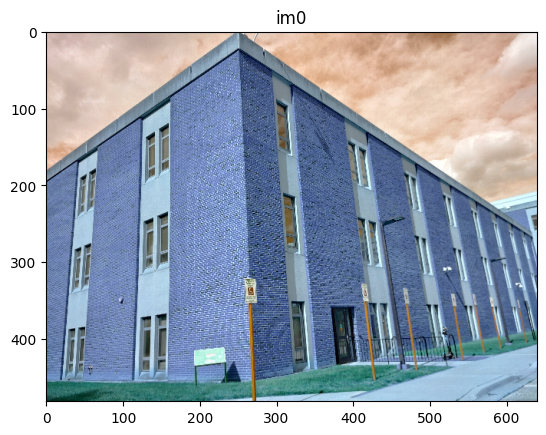

In [ ]:
idx = 0
copy_image = images_down[idx].copy()
plt.title(f'im{idx}')
plt.imshow(copy_image)


# Camera Calibration

The camera used was the main one embebbed in the Motorola G71 5G that according to its specs, it has triple lens each one with the following characteristics:

50 MP, f/1.8, (wide), 1/2.76", 0.64µm, PDAF

8 MP, f/2.2, 118˚ (ultrawide), 1/4.0", 1.12µm

2 MP, f/2.4, (macro)

All the photos were took with the same camera.
Reason for it is that in
a previous project the camera calibration was done with the following results: https://drive.google.com/drive/folders/1VcAmO8PvcaqSV6IJ_Cmf3FXygb7No9ZQ?usp=sharing
where the resizing of images was also done using the same ratio of 8/51 so this parameters are valid.

In [ ]:
INTR_MATRIX = np.array([[538.16675927, 0.0, 319.725792  ],
                [  0.0, 536.27083023, 241.74638681],
                [  0.0 , 0.0 ,1.0 ]]) #intrinsic matrix default
OPT_INTR_MATRIX = np.array([[ 550.4601935, 0.0, 319.19643836 ],
                    [ 0.0, 540.22092167, 241.52112037 ],
                    [  0.0, 0.0, 1.0 ]]) #optimized intrinsic matrix
DIST_COEFF = np.array([[ 1.79366580e-01, -1.26764923e+00, -6.71838107e-04, -1.07269228e-03, 2.77965588e+00]])
IDEAL_RECT = [(25,589) , (22,437)] #the ideal rectangle when all pixels considered are valid after undistortion reside

In [ ]:

print('\nthe intrinsic matrix is:\n')
print(INTR_MATRIX)
print('\ndistortion coefficients of the lens:\n')
print(DIST_COEFF)


the intrinsic matrix is:

[[538.16675927   0.         319.725792  ]
 [  0.         536.27083023 241.74638681]
 [  0.           0.           1.        ]]

distortion coefficients of the lens:

[[ 1.79366580e-01 -1.26764923e+00 -6.71838107e-04 -1.07269228e-03
   2.77965588e+00]]


## Optional: undistort images first

In [ ]:
# #It's important to undistort images just in case because in triangulation you expect 2d points in normalized coordinate system
# undistorted_images = []
# for image in images_down:
#   undist_image = cv.undistort(image, INTR_MATRIX, DIST_COEFF, None, OPT_INTR_MATRIX)
#   #crop to proper rectangle
#   undist_image = undist_image[ IDEAL_RECT[1][0]:IDEAL_RECT[1][0]+IDEAL_RECT[1][1], IDEAL_RECT[0][0]:IDEAL_RECT[0][0]+IDEAL_RECT[0][1] ]
#   undistorted_images.append(undist_image)

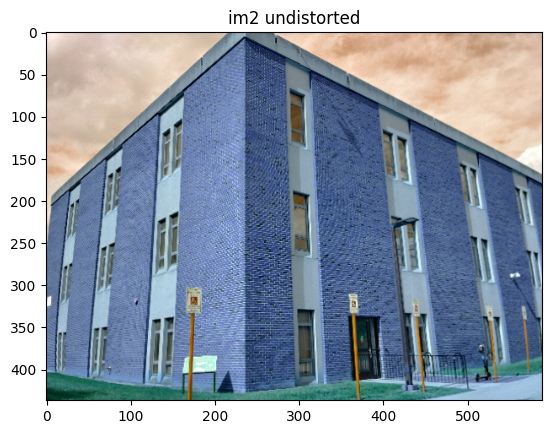

In [ ]:
# idx = 2
# copy_image_undist = undistorted_images[idx].copy()
# plt.title(f'im{idx} undistorted')
# plt.imshow(copy_image_undist)

# Feature detection and matching

## Identify matching features between pair of images

In [ ]:
NUMBER_KEYPOINTS = 2000
# Initiate ORB detector
#The USE OF ORB Detector is due to be strong, a combination of FAST and BREAD algorithms .
#SURF zzits improved version is patented
#Harry is non scale invariant
#ORB is the best of both being free, open source, and combinating FAST+ BRIEF good points
#source: https://medium.com/@deepanshut041/introduction-to-orb-oriented-fast-and-rotated-brief-4220e8ec40cf
images_features = { 'key_desc': { 'keypoints': {}, 'descriptors': {} } }
images_set = {'gray':{} }
folder = []
descriptors_frames = []
orb = cv.ORB_create(NUMBER_KEYPOINTS)# number max keypoints to get
for idx,image in enumerate(images_down):
  image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
  images_set['gray'][idx] = image_gray
  # Detect key points and compute descriptors
  keypoints, descriptors = orb.detectAndCompute(image_gray, None)
  images_features['key_desc']['keypoints'][idx] = keypoints
  images_features['key_desc']['descriptors'][idx] = descriptors

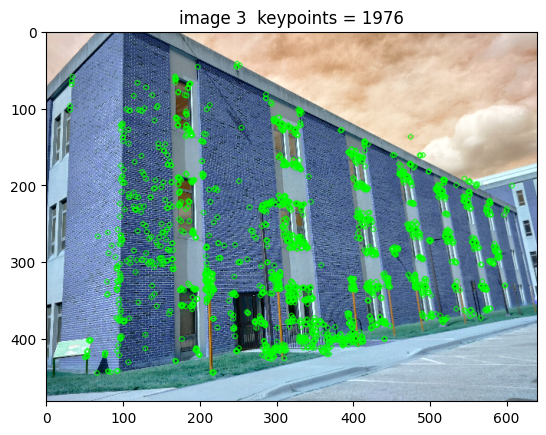

In [ ]:
idx = 3
folder_images_keypoints = []
#draw keypoints idx image
image_copy = images_down[idx].copy()
image_keypoints = cv.drawKeypoints(image_copy, images_features['key_desc']['keypoints'][idx] , None, color=(0,255,0), flags=0)
plt.title(f"image {idx}  keypoints = {len(images_features['key_desc']['keypoints'][idx])}")
plt.imshow(image_keypoints)

## Matching

In [ ]:
#source https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
#source: https://docs.opencv.org/3.4/d5/d6f/tutorial_feature_flann_matcher.html
#This will be done for every room set
# FLANN parameters
#Fast Library for Approximate Nearest Neighbors to extract features and began filter some 'good matches'
checks_search = 200
FLANN_INDEX_KDTREE = 1
FLANN_INDEX_LSH = 6
INDEX_PARAMS= dict(algorithm = FLANN_INDEX_LSH,
                   table_number = 12,
                   key_size = 20,
                   multi_probe_level = 2)
SEARCH_PARAMS = dict(checks_search = checks_search)   # or pass empty dictionary
flann = cv.FlannBasedMatcher(INDEX_PARAMS,SEARCH_PARAMS)
images_features['matches_pair'] = {}
MATCHES_SEQUENCE = []
#obtain matches between two images
print('Matching pairs are:\n')
for idx in range(0,TOTAL_IMAGES-1):
  idx_from = 0 if idx == SEP_IMAGES else idx
  print(idx_from, idx+1)
  matches = flann.knnMatch(images_features['key_desc']['descriptors'][idx_from], images_features['key_desc']['descriptors'][idx+1] , k=2) #distance to second neighbor
  images_features['matches_pair'][f'{idx_from}_{idx+1}'] = matches
  MATCHES_SEQUENCE.append([idx_from,idx+1])

Matching pairs are:

0 1
1 2
2 3
3 4
4 5
5 6
6 7
7 8
0 9
9 10
10 11
11 12
12 13
13 14
14 15
15 16


In [ ]:
#Check and store the good matches
# ratio test as per Lowe's paper to filter
good_matches_mask_per_pair = []
good_matches_pairs_frames = []
images_features['good_matches_pair'] = {}
images_features['good_matches_mask'] = {}
for key_match in images_features['matches_pair']:
  images_features['good_matches_pair'][key_match] = []
  images_features['good_matches_mask'][key_match] = []
  good_matches_mask = [[0, 0] for idx in range(len(images_features['matches_pair'][key_match]))]
  good_matches_info = []
  for index,feature_match in enumerate(images_features['matches_pair'][key_match]):
      #some pairs had only one element
      if len(feature_match) != 2:
        continue
      #a good match should pass this threshold
      image_query_feature, image_train_feature = feature_match
      if image_query_feature.distance < 0.7*image_train_feature.distance:
        good_matches_mask[index] = [1,0]
        good_matches_info.append(image_query_feature)
  print(f'{key_match} has  {len(good_matches_info)} considered good matches')
  images_features['good_matches_mask'][key_match] = good_matches_mask
  images_features['good_matches_pair'][key_match] = good_matches_info


0_1 has  367 considered good matches
1_2 has  160 considered good matches
2_3 has  138 considered good matches
3_4 has  229 considered good matches
4_5 has  227 considered good matches
5_6 has  177 considered good matches
6_7 has  19 considered good matches
7_8 has  103 considered good matches
0_9 has  163 considered good matches
9_10 has  155 considered good matches
10_11 has  181 considered good matches
11_12 has  216 considered good matches
12_13 has  225 considered good matches
13_14 has  182 considered good matches
14_15 has  225 considered good matches
15_16 has  197 considered good matches


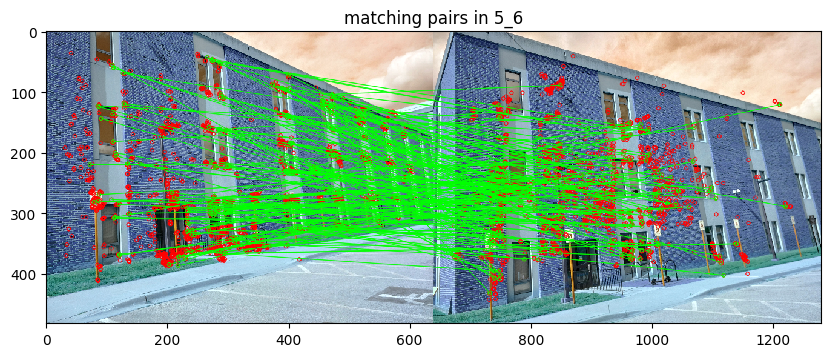

In [ ]:
idx_from = 5
idx_to = 6
# # Need to draw only good matches, so create a mask
draw_params = dict(matchColor = (0,255,0),
                  singlePointColor = (255,0,0),
                  matchesMask = images_features['good_matches_mask'][f'{idx_from}_{idx_to}'],
                  flags = cv.DrawMatchesFlags_DEFAULT)
image_feature_matching = cv.drawMatchesKnn(images_down[idx_from],
                                           images_features['key_desc']['keypoints'][idx_from],
                                           images_down[idx_to],
                                           images_features['key_desc']['keypoints'][idx],
                                           images_features['matches_pair'][f'{idx_from}_{idx_to}'],
                                           None,**draw_params)
fig, axis = plt.subplots(figsize=(10, 10))
axis.set_title(f'matching pairs in {idx_from}_{idx_to}')
axis.imshow(image_feature_matching, interpolation='nearest')

### Estimate Fundamental and Essential Matrix

In [ ]:
#https://www.mathworks.com/help/vision/ug/structure-from-motion-from-multiple-views.html
images_features['camera_pose'] = {}
images_features['points'] = {}
images_features['fundamental_matrix'] = {}
images_features['fund_mask'] = {}
for index_key in  images_features['good_matches_pair']:
    good_pairs = images_features['good_matches_pair'][index_key]
    from_idx, to_idx = index_key.split('_')
    #define coordinate points from origin and destiny image
    points_image_source = np.float32([ images_features['key_desc']['keypoints'][int(from_idx)][match_sequence.queryIdx].pt for match_sequence in good_pairs ]).reshape(-1,1,2)
    points_image_destination = np.float32([ images_features['key_desc']['keypoints'][int(to_idx)][match_sequence.trainIdx].pt for match_sequence in good_pairs ]).reshape(-1,1,2)
    essent_matrix, mask_essent = cv.findEssentialMat(points_image_source, points_image_destination, INTR_MATRIX, method=cv.RANSAC, prob=0.999, threshold=1.0)
    #if you get an error please check the images you're using or if there is a noisy value  eg: inf,NaN,None,etc..
    _, rot, trans, _= cv.recoverPose(essent_matrix, points_image_source, points_image_destination, INTR_MATRIX, mask=mask_essent)
    images_features['camera_pose'][index_key] = { 'rot': rot, 'trans': trans }
    images_features['points'][index_key] = {'from': points_image_source, 'to': points_image_destination}

In [ ]:
idx_from = 0
idx_to = 1
idx_match = f'{idx_from}_{idx_to}'
print(f'for match {idx_match}')
print('camera pose is:')
print(images_features['camera_pose'][idx_match])
print('points total are  is:')
print(f" from: {len(images_features['points'][idx_match]['from'])}, to: {len(images_features['points'][idx_match]['to'])}" )

for match 0_1
camera pose is:
{'rot': array([[ 0.9992983 , -0.03609679, -0.00999663],
       [ 0.03615047,  0.9993326 ,  0.00524293],
       [ 0.0098007 , -0.00560063,  0.99993629]]), 'trans': array([[-0.95797526],
       [-0.0094342 ],
       [-0.28669564]])}
points total are  is:
 from: 367, to: 367


# Triangularization by Stereo rectify
Pipeline taken from: [Stereo setup with calibration](https://github.com/niconielsen32/ComputerVision/blob/master/pointClouds/stereoCalibrate.py)
[Point cloud construction](https://github.com/niconielsen32/ComputerVision/blob/master/pointClouds/pointCloud.py)

In [ ]:
#Obtain maps for undistortion and disparity matrix for 3D image computation
images_features['stereo'] = {}
for index_key in images_features['camera_pose']:
  images_features['stereo'][index_key] = {}
  rot_matrix = images_features['camera_pose'][index_key]['rot']
  trasl_matrix = images_features['camera_pose'][index_key]['trans']
  rect_L, rect_R, proj_matrix_L, proj_matrix_R, Q_matrix, roi_L, roi_R =  cv.stereoRectify(INTR_MATRIX, DIST_COEFF, INTR_MATRIX, DIST_COEFF, (WIDTH,HEIGHT), rot_matrix, trasl_matrix)
  stereo_map_L = cv.initUndistortRectifyMap(OPT_INTR_MATRIX, DIST_COEFF, rect_L, proj_matrix_L, (WIDTH,HEIGHT), cv.CV_16SC2)
  stereo_map_R = cv.initUndistortRectifyMap(OPT_INTR_MATRIX, DIST_COEFF, rect_R, proj_matrix_R, (WIDTH,HEIGHT), cv.CV_16SC2)
  images_features['stereo'][index_key] = { 'from': stereo_map_L, 'to': stereo_map_R , 'disp_map_matrix': Q_matrix}



In [ ]:
images_rectified = {}
for index_key in images_features['stereo']:
  from_idx, to_idx = index_key.split('_')
  stereo_from = images_features['stereo'][index_key]['from']
  stereo_to = images_features['stereo'][index_key]['to']
  # Undistort and rectify images
  img_from_rect_undist = cv.remap(images_down[int(from_idx)], stereo_from[0], stereo_from[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
  img_to_rect_undist = cv.remap(images_down[int(to_idx)], stereo_to[0], stereo_to[1], cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
  images_rectified[index_key] = { 'from': img_from_rect_undist ,'to': img_to_rect_undist }

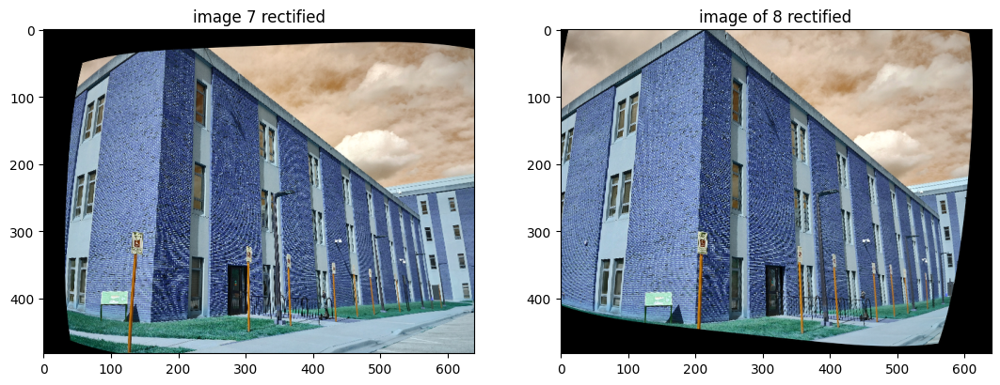

In [ ]:
idx_from = 7
idx_to = 8
idx_match = f'{idx_from}_{idx_to}'
#draw keypoints idx image
fig, axes = plt.subplots(1, 2, figsize=(13, 13))
axes[0].imshow(images_rectified[idx_match]['from'])
axes[0].set_title(f'image {idx_from} rectified')
axes[1].imshow(images_rectified[idx_match]['to'])
axes[1].set_title(f'image of {idx_to} rectified')
plt.show()

In [ ]:
#See  https://docs.opencv.org/3.4/d2/d85/classcv_1_1StereoSGBM.html
STEREO = {}
#Stereo processing by semiglobal matching and mutual information parameters
#Tunning was done experimenting behaviour with different parameters,
#P1,P2 should ve avoided in this case by the results and also speckle parameters, degrade the result
UNIQ_RATIO = 5#10 #5
BLOCK_SIZE = 5#5 #1
MIN_DISP = 0
NUM_DISP = 48
P1 = 8 * 3 * BLOCK_SIZE**2
P2 = 32 * 3 * BLOCK_SIZE**2
DISP12MAX = 10
SPECKLE_WIN = 5
SPECKLE_RANGE = 2
stereo_bm_object = cv.StereoSGBM_create(numDisparities= NUM_DISP,
                                        blockSize= BLOCK_SIZE,
                                        minDisparity= MIN_DISP,
                                        uniquenessRatio = UNIQ_RATIO,
                                        disp12MaxDiff = DISP12MAX,
                                        # speckleWindowSize = SPECKLE_WIN,
                                        # speckleRange = SPECKLE_RANGE,
                                        # P1= P1,
                                        # P2= P2
                                        )

In [ ]:
#Get disparities map
image_disparities = {}
for index_key in images_rectified:
  image_disparities[index_key] = { 'map': None, 'norm': None}
  img_from = images_rectified[index_key]['from']
  img_to = images_rectified[index_key]['to']
  img_gray_from  = cv.cvtColor(img_from.copy(), cv.COLOR_BGR2GRAY )
  img_gray_to = cv.cvtColor(img_to.copy(), cv.COLOR_BGR2GRAY )
  disparity = stereo_bm_object.compute(img_gray_from, img_gray_to)
  # Convert disparity map to float32 and divide by 16 as show in the OpenCV documentation
  disparity_map = np.float32(np.divide(disparity, 16.0))
  #rescale disparity map to be in proper grayscale
  disparity_map_norm = cv.normalize(disparity_map, disparity_map, alpha=255,
                              beta=0, norm_type=cv.NORM_MINMAX)
  disparity_map_norm = np.uint8(disparity_map_norm)
  image_disparities[index_key]['map'] = disparity
  image_disparities[index_key]['norm'] = disparity_map_norm

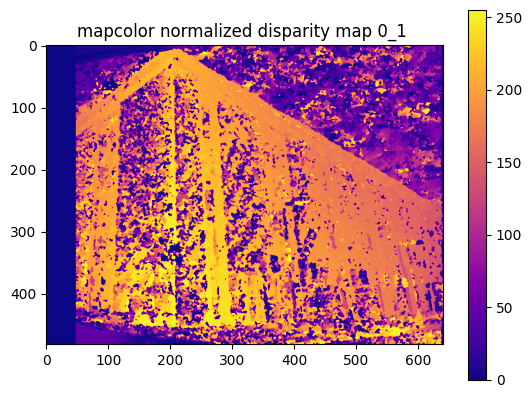

In [ ]:
idx_from = 0
idx_to = 1
plt.title(f'mapcolor normalized disparity map {idx_from}_{idx_to} ')
plt.imshow(image_disparities[f'{idx_from}_{idx_to}']['norm'], cmap='plasma')
plt.colorbar()
plt.show()

In [ ]:
#THIS PROCESS COUDL TAKE A MINUTE DUE TO THE CHECKING OF INF-NAN VALUES
point_3D_images = {}
exclude_keys = ['12_13','15_16'] #in case bad disparities appear
for index_key in image_disparities:
  if index_key in exclude_keys:
    continue
  point_3D_images[index_key] = { 'points': None, 'colors': None }
  # Reproject points into 3D
  points_3D_raw = cv.reprojectImageTo3D(image_disparities[index_key]['map'], images_features['stereo'][index_key]['disp_map_matrix'], handleMissingValues=False)
  # Get color of the reprojected points
  colors_raw = cv.cvtColor(images_rectified[index_key]['to'], cv.COLOR_BGR2RGB)
  # Mask colors and points.
  # # Get rid of points with value 0 (no depth)
  mask_map = disparity_map > disparity_map.min()
  points_3D_raw_1 = points_3D_raw[mask_map]
  colors_raw_1 = colors_raw[mask_map]
  #TODO: ACHIEVE SOLUTION WITH MASKING FOR FILTER INF AND NAN POINTS
  # #Generate a boolean mask for invalid values (inf and NaN) along axis 1
  # # Invert the mask to keep valid points
  # inf_nan_mask = np.any(np.logical_or(np.isinf(points_3D_raw_1), np.isnan(points_3D_raw_1)), axis=1)
  # valid_mask = ~inf_nan_mask
  # # Filter out invalid points using the mask
  # filtered_points_3D = points_3D_raw[valid_mask]
  filtered_points_3D = []
  filtered_colors = []
  for idx,elem in enumerate(points_3D_raw_1):
    if np.any(np.logical_or(np.isinf(elem), np.isnan(elem))):
      continue
    filtered_points_3D.append(elem)
    filtered_colors.append(colors_raw_1[idx])
  point_3D_images[index_key]['points'] = np.array(filtered_points_3D)
  point_3D_images[index_key]['colors'] = np.array(filtered_colors)



In [ ]:
EXT_MATRIX_BASE = np.hstack((np.eye(3), np.zeros((3, 1))))# we're assuming this is the base camera pose from 0 to 0 aligned the optical center of the camera
PROJ_MATRIX_BASE = np.vstack((EXT_MATRIX_BASE, [0,0,0,1]))
#to transform any 3D point into the reference coordinate frame considered
def proj_matrix_ref_view(poses, from_frame, to_frame):
  proj_matrix = PROJ_MATRIX_BASE
  if from_frame == 0:
    print('is already with respect to origin, returning identity')
    return PROJ_MATRIX_BASE
  from_counter = 0
  to_counter = SEP_IMAGES + 1 if from_frame > SEP_IMAGES else 1
  while to_counter <= to_frame:
    index_check = f'{from_counter}_{to_counter}'
    current_pose = poses.get(index_check, None)
    if current_pose  is not None:
      matrix = np.hstack((current_pose['rot'], current_pose['trans']))
      matrix = np.vstack((matrix, [0, 0, 0, 1]))
      proj_matrix = proj_matrix @ matrix
      from_counter = to_counter
      to_counter += 1
  return proj_matrix

In [ ]:
for index_key in point_3D_images:
  from_idx, to_idx = index_key.split('_')
  #change 3D points that are not referenced to the image 0
  if int(from_idx) != 0:
    to_origin_coordinates = PROJ_MATRIX_BASE#proj_matrix_ref_view(images_features['camera_pose'], int(from_idx), int(to_idx))
    #convert to homogenous coordinates
    points_3D_format = np.column_stack((point_3D_images[index_key]['points'], np.full(len(point_3D_images[index_key]['points']), 1)))
    point_3D_real = np.dot(to_origin_coordinates, points_3D_format.reshape(4,-1))
    point_3D_images[index_key]['points'] = point_3D_real[:3, :].reshape(-1,3)


# Dense reconstruction
There is still limitations of the number of points to display when it reached a certain value

In [ ]:

LIMIT_POINTS = 200000 #more points slows the process
total_set_points = []
total_set_colors = []
all_points_3D = []
for index_key in point_3D_images:
  vertices = point_3D_images[index_key]['points']
  colors = point_3D_images[index_key]['colors'].reshape(-1,3)
  total_set_points.append(vertices)
  total_set_colors.append(colors)
all_points_3D = np.concatenate(total_set_points,axis=0)[0:LIMIT_POINTS]
all_colors_3D = np.concatenate(total_set_colors,axis=0)[0:LIMIT_POINTS]

In [ ]:
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=all_points_3D[:,0], y=all_points_3D[:,1], z=all_points_3D[:,2],
            mode='markers',
            marker=dict(size=1, color=all_colors_3D)
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()

# Some functions to keep testing

In [ ]:
#Convert to pount cloud file
# OUTPUT_FILE = 'pointCloud.ply'
# LIMIT_POINTS = 500
# def create_point_cloud_file(views, filename):
#   vertices_views = []
#   for index_key in views:
#     vertices = views[index_key]['points'][0:LIMIT_POINTS]
#     colors = views[index_key]['colors'].reshape(-1,3)
#     vertices_views.append(np.hstack([vertices.reshape(-1,3),colors[0:LIMIT_POINTS]]))
#   vertices_total = np.concatenate(vertices_views,axis=0)
#   ply_header = '''ply
#     format ascii 1.0
#     element vertex %(vert_num)d
#     property float x
#     property float y
#     property float z
#     property uchar red
#     property uchar green
#     property uchar blue
#     end_header
#     '''
#   with open(filename, 'w') as f:
#     f.write(ply_header %dict(vert_num=len(vertices_total)))
#     np.savetxt(f,vertices_total,'%f %f %f %d %d %d')

In [ ]:
# Generate point cloud file
# create_point_cloud_file(point_3D_images, OUTPUT_FILE)

In [ ]:
# # Build the projection matrices for each pair of scenes with camera pose results
# point_3D_images = {}
# for index_key in  images_features['camera_pose']:
#   print(index_key)
#   from_idx, to_idx = index_key.split('_')
#   matrix = images_features['camera_pose'][index_key]
#   extrinsic_matrix = np.hstack((matrix['rot'], matrix['trans']))
#   #Convert the projection matrices to the camera coordinate system of the first view
#   proj_matrix = extrinsic_matrix
#   #Triangulate the 3D points
#   hom_coord_points = cv.triangulatePoints(PROJ_MATRIX_BASE, proj_matrix, images_features['points'][index_key]['from'], images_features['points'][index_key]['to'])
#   points_3D = hom_coord_points / hom_coord_points[3]  # Convert from homogeneous to Cartesian coordinates
#   #change 3D points that are not referenced to the image 1
#   if int(from_idx) != 0:
#     to_origin_coordinates = proj_matrix_ref_view(images_features['camera_pose'], int(from_idx), int(to_idx))
#     point_3D_real = np.dot(to_origin_coordinates, points_3D)
#     points_3D_real = points_3D[:3, :].T
#   else:
#     points_3D_real = points_3D[:3, :].T
#   # points_3D_real = points_3D[:3, :].T
#   point_3D_images[index_key]['points'].append(points_3D_real)
